In [ ]:
!pip install pygad

In [ ]:
import pygad
import warnings

warnings.filterwarnings('ignore')

# **Optimización de la función Rastrigin con algoritmo genético para dos dimensiones**

Recordemos que el valor óptimo de la función de Rastrigin es el punto (0,0) para dos dimensiones

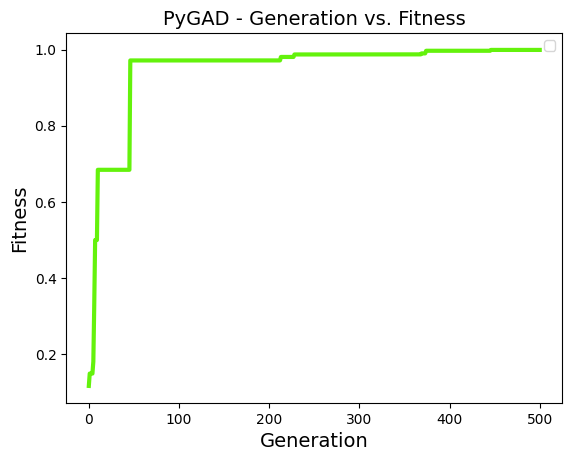



La mejor solución obtenida al terminar el algoritmo fue el vector: [-0.00078106  0.00191557] con un fitness de 0.9991517137793919



In [ ]:
import pygad
import numpy as np

# Definir la función de dos variables
def rastrigin_function(x1, x2):
    return 20 + (x1)**2 + (x2)**2 - 10 * (np.cos(2*np.pi*x1) + np.cos(2*np.pi*x2))


# Evalua 1/(1 + func(sol_actual)), si la función es cercana al mínimo, el resultado de la división será más grande y viceversa
def fitness_function(ga_instance, solution, solution_index):
    return 1.0/(1.0+ rastrigin_function(solution[0],solution[1]))

best_solutions_each_generation = []

def on_generation(ga_instance):
    best_solutions_each_generation.append(ga_instance.best_solution()[0])

ga_instance =  pygad.GA(num_generations = 500,
                        sol_per_pop = 10,
                        num_parents_mating=5,
                        num_genes=2,
                        parent_selection_type="sss",
                        fitness_func= fitness_function,
                        save_solutions=True,
                        crossover_type = "single_point",
                        mutation_type = "random",
                        mutation_percent_genes = 50,
                        on_generation=on_generation)

ga_instance.run()
ga_instance.plot_fitness()

best_solution = ga_instance.best_solution()[0]
fitness_best_solution = ga_instance.best_solution()[1]

print()
print()

print(f'La mejor solución obtenida al terminar el algoritmo fue el vector: {best_solution} con un fitness de {fitness_best_solution}')
print()

In [ ]:
import matplotlib.pyplot as plt
import imageio
import random

# Seteo los ejes sobre los que voy a trabajar
plt.xlim(-0.25,0.25)
plt.ylim(-0.25,0.25)

# Generamos la nube de puntos sobre la que se generarán las curvas de nivel
x = np.linspace(-0.25,0.25, 100)
y = np.linspace(-0.25,0.25, 100)
x, y = np.meshgrid(x, y)
z = rastrigin_function(x, y)

# Generamos las curva de nivel de la función
plt.contour(x, y, z, levels=100, cmap='viridis')

# Etiquetas de los ejes
plt.xlabel('$x_{1} \;  \in \; \mathbb{R}$')
plt.ylabel('$x_{2} \;  \in \; \mathbb{R}$')

# Solucion real
plt.scatter(0, 0, color='blue', label='(0, 0)')


# Mostrar el gráfico
plt.colorbar(label='Niveles en  $z \; \in \mathbb{R}$')
plt.title('Mejor solucion de la generacion 0')
plt.grid(True)

images = []
# Colores para trazar los puntos que son la mejor solución de cada generación de forma que si se solapan los puntos se vea el cambio
colors = ['red', 'yellow', 'green', 'orange', 'pink']

for generation in range(len(best_solutions_each_generation)):
    # Se geeneran las etiquetas de cada frame del video y su respectiva generación
    plt.title(f'Mejor solucion de la generacion {generation+1} (punto azul solución real)')

    # Graficar la mejor solución de cada generación
    plt.scatter(best_solutions_each_generation[generation][0], best_solutions_each_generation[generation][1], color = colors[random.randint(0, 4)])

    # Se guarda cada frame como imagen para luego usar las imagenes guardadas para generar el video
    plt.savefig(f'generation_{generation}.png')

    # Se agrega la imagen a la lista de imagenes para luego generar el gif
    images.append(imageio.imread(f'generation_{generation}.png'))

# Se genera el gif a partir de la lista de imagenes y se guarda en el sistema de archivos
imageio.mimsave('rastrigin_contour.gif', images, fps=1000)

# Para no mostrar la figura actual aún
plt.close()


In [ ]:
from IPython.display import Video
from moviepy.editor import VideoFileClip

gif_path = 'rastrigin_contour.gif'

# Convertir GIF a video
clip = VideoFileClip(gif_path)
video_path = "output.mp4"
clip.write_videofile(video_path, fps=1000, logger=None)

# Mostrar el video
Video(video_path, embed=True)

# **Optimización de la función Rastrigin con algoritmo genético para tres dimensiones**

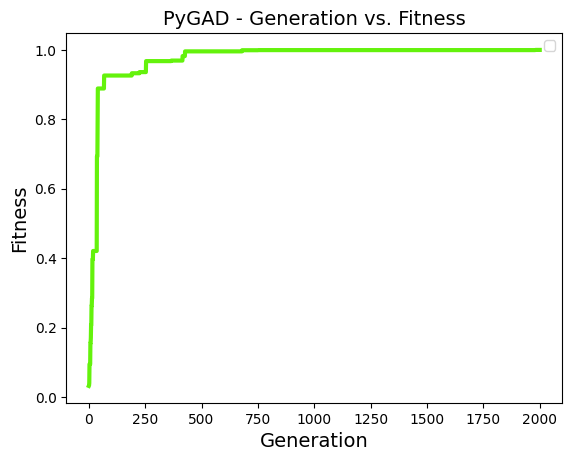



La mejor solución obtenida al terminar el algoritmo fue el vector: [-4.44427058e-05 -3.73451721e-04 -1.29090947e-03] con un fitness de 0.9996414596179518



In [ ]:
import pygad
import numpy as np

# Función de Rastrigin en 3 dimensiones
def rastrigin_3_dim(x, y, z):
    A = 10
    n = 3
    return A*n + (x**2 - A * np.cos(2 * np.pi * x)) + (y**2 - A * np.cos(2 * np.pi * y)) + (z**2 - A * np.cos(2 * np.pi * z))

# Evalua 1/(1 + func(sol_actual)), si la función es cercana al mínimo, el resultado de la división será más grande y viceversa
def fitness_fucntion(ga_instance, solution, solution_index):
    return 1.0/(1.0+ np.abs(rastrigin_3_dim(solution[0],solution[1], solution[2])))

best_solutions_each_generation = []

def on_generation(ga_instance):
    best_solutions_each_generation.append(ga_instance.best_solution()[0])

ga_instance =  pygad.GA(num_generations = 2000,
                        sol_per_pop = 10,
                        num_parents_mating=5,
                        num_genes=3,
                        parent_selection_type="sss",
                        fitness_func= fitness_fucntion,
                        save_solutions=True,
                        mutation_type = "random",
                        mutation_percent_genes = 50,
                        on_generation=on_generation)

ga_instance.run()
ga_instance.plot_fitness()


best_solution = ga_instance.best_solution()[0]
fitness_best_solution = ga_instance.best_solution()[1]


print()
print()

print(f'La mejor solución obtenida al terminar el algoritmo fue el vector: {best_solution} con un fitness de {fitness_best_solution}')
print()



Ahora graficamos con respecto a X1 y X3:

In [ ]:
# Función de Rastrigin en 3 dimensiones con respecto a y,z
def rastrigin_3_dim_y_z(y, z):
    A = 10
    n = 3
    return A*n + (0 - A * np.cos(2 * np.pi * 0)) + (y**2 - A * np.cos(2 * np.pi * y)) + (z**2 - A * np.cos(2 * np.pi * z))

# Función de Rastrigin en 3 dimensiones con respecto a x,z
def rastrigin_3_dim_x_z(x, z):
    A = 10
    n = 3
    return A*n + (x**2 - A * np.cos(2 * np.pi * x)) + (0 - A * np.cos(2 * np.pi * 0)) + (z**2 - A * np.cos(2 * np.pi * z))

In [ ]:
import matplotlib.pyplot as plt
import imageio
import random
from IPython.display import Video
from moviepy.editor import VideoFileClip


# Seteo los ejes sobre los que voy a trabajar
plt.xlim(-5.12, 5.12)
plt.ylim(-5.12, 5.12)

# Generamos la nube de puntos sobre la que se generarán las curvas de nivel
x = np.linspace(-5.12, 5.12, 100)
z = np.linspace(-5.12, 5.12, 100)
x, z = np.meshgrid(x, z)
w = rastrigin_3_dim_x_z(x, z)

# Generamos las curva de nivel de la función
plt.contour(x, z, w)

# Etiquetas de los ejes
plt.xlabel('$x_{1} \;  \in \; \mathbb{R}$')
plt.ylabel('$x_{3} \;  \in \; \mathbb{R}$')

# Solucion real
plt.scatter(0, 0, color='blue', label='(0, 0)')

punto_x = random.uniform(1.8, -1.8)
punto_y = random.uniform(1.8, -1.8)


# Mostrar el gráfico
plt.colorbar(label='Niveles $ \; \in \mathbb{R}$')
plt.title(f'Solucion 3d respecto X1, X3{punto_x},{punto_y}')
plt.grid(True)

images = []
# Colors to plot points that are the best solution of each generation so that if points overlap the change is seen
colors = ['red', 'yellow', 'green', 'orange', 'pink']

for punto  in range(0,len(best_solutions_each_generation), 10):

    punto_x = '%.5f'%best_solutions_each_generation[punto][0]
    punto_z = '%.5f'%best_solutions_each_generation[punto][1]

    # Se geeneran las etiquetas de cada frame del video y su respectiva generación
    plt.title(f'Solucion 3d respecto X1, X3{punto_x, punto_z}')

    # Graficar la mejor solución de cada generación
    plt.scatter(best_solutions_each_generation[punto][0], best_solutions_each_generation[punto][1], color = colors[random.randint(0, 4)])

    # Se guarda cada frame como imagen para luego usar las imagenes guardadas para generar el video
    plt.savefig(f'Solucion 3d respecto X1, X3{punto_x},{punto_y}.png')

    # Se agrega la imagen a la lista de imagenes para luego generar el gif
    images.append(imageio.imread(f'Solucion 3d respecto X1, X3{punto_x},{punto_y}.png'))

# Se genera el gif a partir de la lista de imagenes y se guarda en el sistema de archivos
imageio.mimsave('rosenbrock_contour.gif', images, fps=1000)

# Para no mostrar la figura actual aún
plt.close()


gif_path = 'rosenbrock_contour.gif'

# Convertir GIF a videos
clip = VideoFileClip(gif_path)
video_path = 'output.mp4'
clip.write_videofile(video_path, fps=1000, logger=None)

# Mostrar el video
Video(video_path, embed=True)


Graficamos con respecto a X2 y X3

In [ ]:
import matplotlib.pyplot as plt
import imageio
import random
from IPython.display import Video
from moviepy.editor import VideoFileClip


# Seteo los ejes sobre los que voy a trabajar
plt.xlim(-5.12, 5.12)
plt.ylim(-5.12, 5.12)

# Generamos la nube de puntos sobre la que se generarán las curvas de nivel
x = np.linspace(-5.12, 5.12, 100)
y = np.linspace(-5.12, 5.12, 100)
x, y = np.meshgrid(x, y)
z = rastrigin_3_dim_y_z(x, y)

# Generamos las curva de nivel de la función
plt.contour(x, y, z)

# Etiquetas de los ejes
plt.xlabel('$x_{2} \;  \in \; \mathbb{R}$')
plt.ylabel('$x_{3} \;  \in \; \mathbb{R}$')

# Solucion real
plt.scatter(0, 0, color='blue', label='(0, 0)')

punto_x = random.uniform(1.8, -1.8)
punto_y = random.uniform(1.8, -1.8)


# Mostrar el gráfico
plt.colorbar(label='Niveles en  $4ta \; dimensión \;  \in \mathbb{R}$')
plt.title(f'Solucion 3d respecto X2, X3{punto_x},{punto_y}')
plt.grid(True)

images = []
# Colors to plot points that are the best solution of each generation so that if points overlap the change is seen
colors = ['red', 'yellow', 'green', 'orange', 'pink']

for punto  in range(0,len(best_solutions_each_generation),100):

    punto_x = '%.5f'%best_solutions_each_generation[punto][0]
    punto_z = '%.5f'%best_solutions_each_generation[punto][1]

    # Se geeneran las etiquetas de cada frame del video y su respectiva generación
    plt.title(f'Solucion 3d respecto  X2, X3{punto_x, punto_z}')

    # Graficar la mejor solución de cada generación
    plt.scatter(best_solutions_each_generation[punto][0], best_solutions_each_generation[punto][1], color = colors[random.randint(0, 4)])

    # Se guarda cada frame como imagen para luego usar las imagenes guardadas para generar el video
    plt.savefig(f'Solucion 3d respecto X2, X3{punto_x},{punto_y}.png')

    # Se agrega la imagen a la lista de imagenes para luego generar el gif
    images.append(imageio.imread(f'Solucion 3d respecto X2, X3{punto_x},{punto_y}.png'))

# Se genera el gif a partir de la lista de imagenes y se guarda en el sistema de archivos
imageio.mimsave('rosenbrock_contour.gif', images, fps=1000)

# Para no mostrar la figura actual aún
plt.close()


gif_path = 'rosenbrock_contour.gif'

# Convertir GIF a videos
clip = VideoFileClip(gif_path)
video_path = 'output.mp4'
clip.write_videofile(video_path, fps=1000, logger=None)

# Mostrar el video
Video(video_path, embed=True)
